In [42]:
import os

def list_dataset_files(base_path):
    
    for dirname, dirnames, filenames in os.walk(base_path):
        print(f"Directory: {dirname}")
        for subdir in dirnames:
            print(f"  Subdirectory: {subdir}")
        for filename in filenames:
            print(f"  File: {os.path.join(dirname, filename)}")

if __name__ == "__main__":
    # Define the base path to the dataset
    base_path = "/Users/didaryilmaz/Downloads/Sohas_weapon-Detection"  # Change this to the path where your dataset is downloaded

    # Check if the base path exists
    if not os.path.exists(base_path):
        print(f"Error: The specified path '{base_path}' does not exist.")
    else:
        # List all files in the dataset directory
        print("Listing files in the dataset directory:")
        list_dataset_files(base_path)

Listing files in the dataset directory:
Directory: /Users/didaryilmaz/Downloads/Sohas_weapon-Detection
  Subdirectory: annotations_test
  Subdirectory: images
  Subdirectory: annotations
  Subdirectory: images_test
  File: /Users/didaryilmaz/Downloads/Sohas_weapon-Detection/.DS_Store
Directory: /Users/didaryilmaz/Downloads/Sohas_weapon-Detection/annotations_test
  Subdirectory: xmls
  File: /Users/didaryilmaz/Downloads/Sohas_weapon-Detection/annotations_test/test.txt
Directory: /Users/didaryilmaz/Downloads/Sohas_weapon-Detection/annotations_test/xmls
  File: /Users/didaryilmaz/Downloads/Sohas_weapon-Detection/annotations_test/xmls/img1261.xml
  File: /Users/didaryilmaz/Downloads/Sohas_weapon-Detection/annotations_test/xmls/knife_359.xml
  File: /Users/didaryilmaz/Downloads/Sohas_weapon-Detection/annotations_test/xmls/ABsframe00157.xml
  File: /Users/didaryilmaz/Downloads/Sohas_weapon-Detection/annotations_test/xmls/billete_2221.xml
  File: /Users/didaryilmaz/Downloads/Sohas_weapon-Dete

In [43]:
#we loop out_each class and its labels one by one to process and agument
image_dir='/Users/didaryilmaz/Downloads/Sohas_weapon-Detection/images'
annot_dir='/Users/didaryilmaz/Downloads/Sohas_weapon-Detection/annotations/xmls'

In [44]:
import os
import cv2
import numpy as np
import pandas as pd
from xml.dom import minidom
import matplotlib.pyplot as plt
import random
import csv
from sklearn.model_selection import train_test_split

In [45]:
def rescaling(path_image,targetSize,xmin,ymin,xmax,ymax):
    # imageToPredict = cv2.imread("img.jpg", 3)
    imageToPredict = cv2.imread(path_image, 3)

    # Note: flipped comparing to your original code!
    # x_ = imageToPredict.shape[0]
    # y_ = imageToPredict.shape[1]
    y_ = imageToPredict.shape[0]
    x_ = imageToPredict.shape[1]

    x_scale = targetSize / x_
    y_scale = targetSize / y_
    img = cv2.resize(imageToPredict, (targetSize, targetSize))
    img = np.array(img)

    # original frame as named values
    (origLeft, origTop, origRight, origBottom) = (xmin,ymin,xmax,ymax)

    xmin = int(np.round(origLeft * x_scale))
    ymin = int(np.round(origTop * y_scale))
    xmax = int(np.round(origRight * x_scale))
    ymax = int(np.round(origBottom * y_scale))
    # Box.drawBox([[1, 0, x, y, xmax, ymax]], img)
    #drawBox([[1, 0, xmin, ymin, xmax, ymax]], img)
    return img,xmin,ymin,xmax,ymax

In [46]:
def exteract_xml_contents(annot_directory, image_dir, target_size=300):
    file = minidom.parse(annot_directory)

    # Get the height and width of the image
    height, width = cv2.imread(image_dir).shape[:2]

    # Get the bounding box
    xmin = file.getElementsByTagName('xmin')
    x1 = float(xmin[0].firstChild.data)

    ymin = file.getElementsByTagName('ymin')
    y1 = float(ymin[0].firstChild.data)

    xmax = file.getElementsByTagName('xmax')
    x2 = float(xmax[0].firstChild.data)

    ymax = file.getElementsByTagName('ymax')
    y2 = float(ymax[0].firstChild.data)

    class_name = file.getElementsByTagName('name')
    if class_name[0].firstChild.data == 'knife':
        class_num = 1
    else:
        class_num = 0

    files = file.getElementsByTagName('filename')
    file_name = files[0].firstChild.data

    # Return the extracted attributes
    img, xmin, ymin, xmax, ymax = rescaling(image_dir, target_size, x1, y1, x2, y2)
    width = img.shape[0]
    height = img.shape[1]
    return file_name, width, height, class_num, xmin, ymin, xmax, ymax


In [47]:
def xml_to_csv(image_dir,annot_dir):
    #List containing all our attributes regarding each image
    
    xml_list=[]
    
    #get each files in the image and annotation  directory
    mat_files=os.listdir(annot_dir)
    img_files=os.listdir(image_dir)
    
    #loop over each of the image and its labels
    
    for i,image in enumerate(img_files):
        xp=image.split('.')
        mat_path=os.path.join(annot_dir,(str(xp[0])+'.xml'))
        img_path=os.path.join(image_dir,image)
        #get attributes for each image
        value=exteract_xml_contents(mat_path,img_path)
        
        xml_list.append(value)
    
    #columns for the pandas dataframe
    columns_name=['file_name','width','height','class_num',
                 'xmin','ymin','xmax','ymax']
    
    xml_df=pd.DataFrame(xml_list,columns=columns_name)
    
    #return the dataframe
    
    return xml_df

In [48]:
train_labels_df=xml_to_csv(image_dir,annot_dir)
train_labels_df.to_csv(('dataset.csv'),index=None)

In [8]:
train_labels_df

,file_name,width,height,class_num,xmin,ymin,xmax,ymax
0,MBbframe00265.jpg,300,300,1,108,187,133,214
1,ABbframe00430.jpg,300,300,1,197,130,209,174
2,MBbframe00271.jpg,300,300,1,94,215,123,228
3,HBmframe00361.jpg,300,300,1,174,150,182,194
4,KravMagaTraining20626.jpg,300,300,1,130,187,166,217
...,...,...,...,...,...,...,...,...
995,RusoClases263.jpg,300,300,1,103,170,128,230
996,billete_2012.jpg,300,300,0,96,85,236,184
997,KravMagaKnifeDefenseTechniques765.jpg,300,300,1,111,196,154,233
998,KravMagaKnifeDefenseTechniques759.jpg,300,300,1,108,203,150,237


In [9]:
class_list=sorted(['knife','no weapon'])

In [10]:
def preprocess_dataset(image_dir,csv_file):
    #list that will contain the whole dataset
    
    labels =[]
    boxes =[]
    img_list=[]
    
    
    with open(csv_file) as csvfile:
        
        rows=csv.reader(csvfile)
        columns=next(iter(rows))
        none={}
        for i,row in enumerate(rows):
            
            img_path=row[0]
            full_path=os.path.join(image_dir,img_path)
            img=cv2.imread(full_path)
            if img is None:
                none[i]=str(full_path)
            else:
                img=cv2.imread(full_path)
                
                image=cv2.resize(img,(300,300))
                

                # Normalize the image by dividing it by 255.0 
                image = image.astype("float") / 255.0

                # Append it to the list of images
                img_list.append(image)

                labels.append(int(row[3]))
                #scalling coordinates to the range of the [0,1] by dividing the cordinate by image size 1096 here
                arr=[float(row[4])/300,
                    float(row[5])/300,
                    float(row[6])/300,
                    float(row[7])/300]
                boxes.append(arr)
            
           
        return labels ,boxes,img_list,none

In [11]:
#all the iage will resized
train_labels,train_boxes,train_img,train_none=preprocess_dataset(image_dir,'dataset.csv')

In [12]:
#shuffling the data
combined_list=list(zip(train_img,train_boxes,train_labels))
random.shuffle(combined_list)
#exteract back the content of each list
train_img,train_boxes,train_labels=zip(*combined_list)

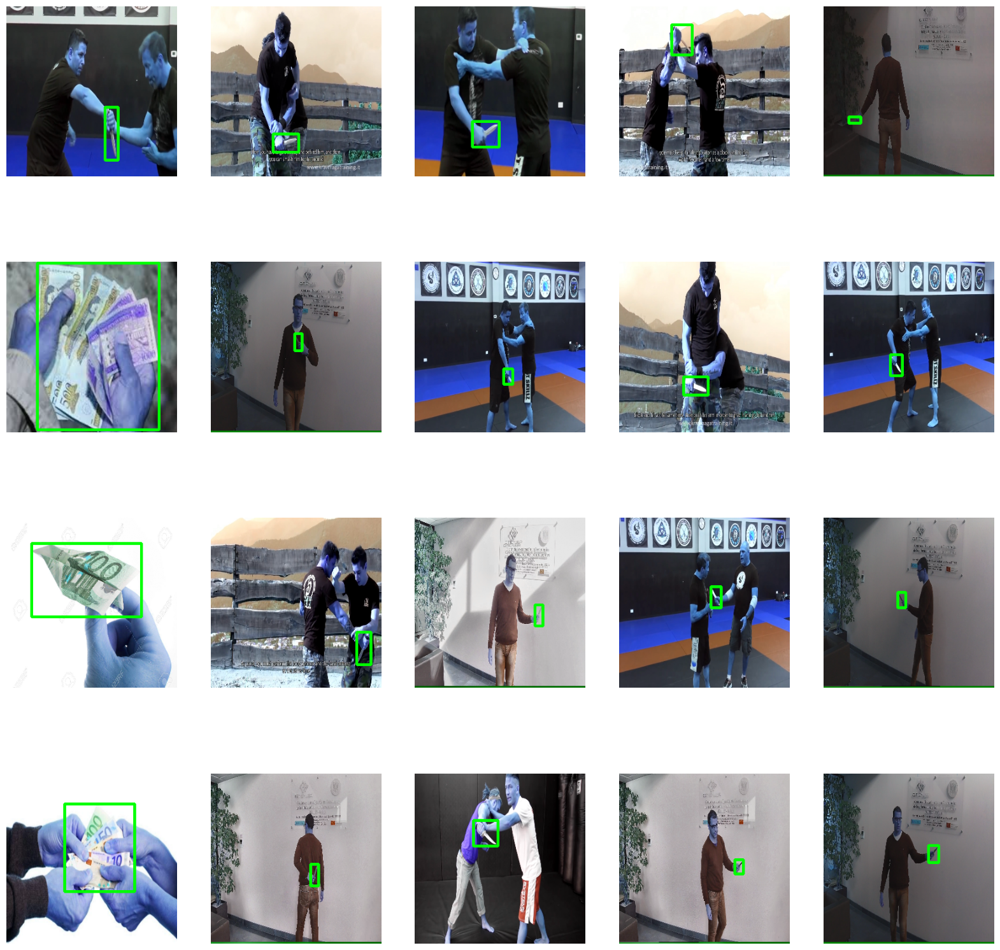

In [13]:
# Create a Matplotlib figure
plt.figure(figsize=(20,20))

# Generate a random sample of images each time the cell is run 
random_range = random.sample(range(1, len(train_img)), 20)

for itr, i in enumerate(random_range,1):

    # Bounding box of each image
    a1, b1, a2, b2 = train_boxes[i]
    img_size = 300

    # Rescaling the boundig box values to match the image size
    x1 = a1 * img_size
    x2 = a2 * img_size
    y1 = b1 * img_size
    y2 = b2 * img_size

    # The image to visualize
    image = train_img[i]

    # Draw bounding boxes on the image
    cv2.rectangle(image, (int(x1),int(y1)),
          (int(x2),int(y2)),
                  (0,255,0),
                  3)
    
    # Clip the values to 0-1 and draw the sample of images
    img = np.clip(train_img[i], 0, 1)
    plt.subplot(4, 5, itr)
    plt.imshow(img)
    plt.axis('off')

In [14]:
# Split the data of images, labels and their annotations
train_images, val_images, train_labels,val_labels, train_boxes, val_boxes = train_test_split( np.array(train_img), 
                np.array(train_labels), np.array(train_boxes), test_size = 0.1,random_state = 43)
 
print('Total Training Images: {}, Total Test Images: {}'.format(
    len(train_images), 
    len(val_images)))

Total Training Images: 900, Total Test Images: 100


In [15]:
import keras 
import tensorflow as tf
from tensorflow.keras.layers import Dense,Input
from tensorflow.keras.models import Model

from tensorflow.keras.layers import GlobalAveragePooling2D,Dropout
from tensorflow.keras.optimizers import SGD

In [16]:
image_size=300

In [17]:
N_mobile = tf.keras.applications.NASNetMobile( input_tensor = Input(
    shape=(image_size, image_size, 3)), 
    include_top=False, 
    weights='imagenet')

In [18]:
# Let's create a function that will construct our model
def create_model(no_of_classes):
 
    # Freeze the whole model
    N_mobile.trainable = False
    base_model_output = N_mobile.output
    flattened_output = GlobalAveragePooling2D()(base_model_output)
    print(flattened_output.shape)
    class_prediction = Dense(256, activation="relu")(flattened_output)
    class_prediction = Dense(128, activation="relu")(class_prediction )
    class_prediction = Dropout(0.2)(class_prediction)
    class_prediction = Dense(64, activation="relu")(class_prediction)
    class_prediction = Dropout(0.2)(class_prediction )
    class_prediction = Dense(32, activation="relu")(class_prediction)
    class_prediction = Dense(no_of_classes, activation='softmax',name="class_output")(class_prediction)
    box_output = Dense(256, activation="relu")(flattened_output)
    box_output = Dense(128, activation="relu")(box_output)
    box_output = Dropout(0.2)(box_output )
 
    box_output = Dense(64, activation="relu")(box_output)
    box_output = Dropout(0.2)(box_output )
 
    box_output = Dense(32, activation="relu")(box_output)
    box_predictions = Dense(4, activation='sigmoid',
                            name= "box_output")(box_output)

    model = Model(inputs=N_mobile.input, outputs= [box_predictions, class_prediction])
 
    return model


In [19]:
model = create_model(2)
model

(None, 1056)


<Functional name=functional, built=True>

In [20]:
losses = { 
    "box_output": "mean_squared_error",
    "class_output": "sparse_categorical_crossentropy"
    }
loss_weights = {
    "box_output": 1.0, 
    "class_output": 1.0
    }
 
metrics = {
    'class_output': 'accuracy', 
    'box_output':  'mse'
    }
stop = tf.keras.callbacks.EarlyStopping(monitor = "val_loss", min_delta = 0.0001, patience = 40, 
                    restore_best_weights = True
                     )

reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor = "val_loss", factor = 0.0002, 
                              patience = 30, min_lr = 1e-7, verbose = 1)
 
# Initialize Optimizer
opt = SGD(learning_rate = 1e-3, momentum = 0.9)
 
# Compile the model with Adam optimizer
model.compile(optimizer = opt, loss = losses, loss_weights = loss_weights, 
    metrics = metrics)

In [21]:
with tf.device('/device:GPU:0'):
  history = model.fit(x = train_images, 
                      y= {
                          "box_output": train_boxes, 
                          "class_output": train_labels
                          }, 
                      validation_data=(
                          val_images, 
                          {
                            "box_output": val_boxes, 
                            "class_output": val_labels
                            }), batch_size = 32, epochs = 10, 
                      callbacks=[reduce_lr, stop])

Epoch 1/10


/Users/didaryilmaz/Documents/GitHub/WeaponDetector/myenvd/lib/python3.9/site-packages/keras/src/models/functional.py:238: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor']
Received: inputs=Tensor(shape=(None, 300, 300, 3))
  warnings.warn(msg)


29/29 ━━━━━━━━━━━━━━━━━━━━ 25s 579ms/step - box_output_loss: 0.0651 - box_output_mse: 0.0651 - class_output_accuracy: 0.6606 - class_output_loss: 0.6261 - loss: 0.6919 - val_box_output_loss: 0.0654 - val_box_output_mse: 0.0633 - val_class_output_accuracy: 0.7300 - val_class_output_loss: 0.5278 - val_loss: 0.5751 - learning_rate: 0.0010
Epoch 2/10
29/29 ━━━━━━━━━━━━━━━━━━━━ 16s 542ms/step - box_output_loss: 0.0591 - box_output_mse: 0.0592 - class_output_accuracy: 0.7819 - class_output_loss: 0.4646 - loss: 0.5242 - val_box_output_loss: 0.0574 - val_box_output_mse: 0.0556 - val_class_output_accuracy: 0.7300 - val_class_output_loss: 0.4800 - val_loss: 0.5216 - learning_rate: 0.0010
Epoch 3/10
29/29 ━━━━━━━━━━━━━━━━━━━━ 13s 455ms/step - box_output_loss: 0.0505 - box_output_mse: 0.0505 - class_output_accuracy: 0.8042 - class_output_loss: 0.3889 - loss: 0.4397 - val_box_output_loss: 0.0527 - val_box_output_mse: 0.0512 - val_class_output_accuracy: 0.7500 - val_class_output_loss: 0.3795 - val_l

In [22]:
def plot(var1, var2, plot_name):
  # Get the loss metrics from the trained model
  c1 = history.history[var1]
  c2 = history.history[var2]
 
  epochs = range(len(c1)
                )
   
  # Plot the metrics
  plt.plot(epochs, c1, 'b', label=var1)
  plt.plot(epochs, c2, 'r', label=var2)
  plt.title(str(plot_name))
  plt.legend()

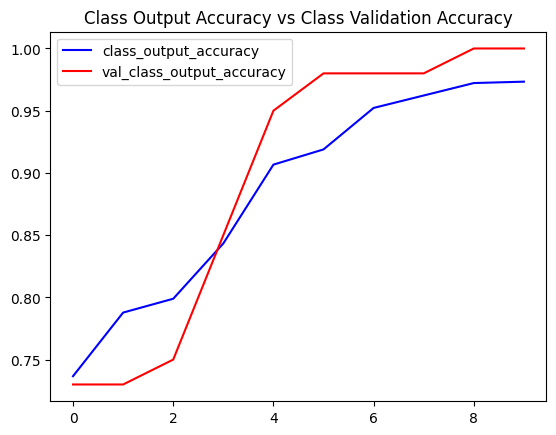

In [23]:
plot( 'class_output_accuracy', 'val_class_output_accuracy', 'Class Output Accuracy vs Class Validation Accuracy')

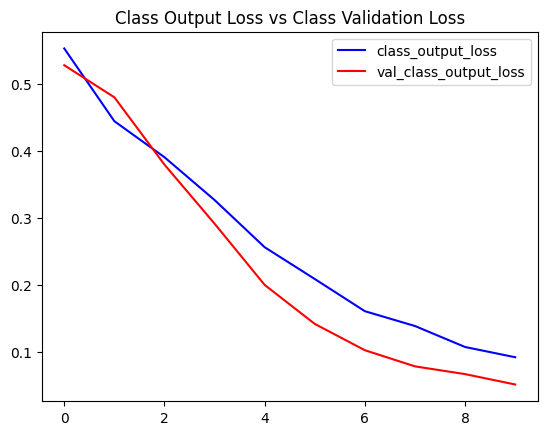

In [24]:
plot( 'class_output_loss', 'val_class_output_loss', 'Class Output Loss vs Class Validation Loss')

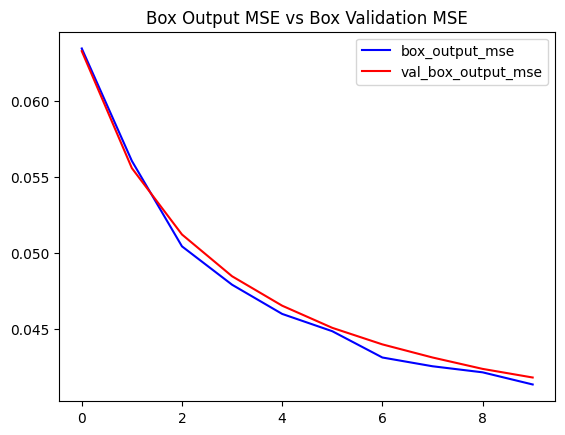

In [25]:
plot( 'box_output_mse', 'val_box_output_mse', 'Box Output MSE vs Box Validation MSE')

In [26]:
#Save your model here in .h5 format.
model.save('weapon_detect.h5')

In [27]:
# Enter your class names in this list
global label_names
 
# Must be same as the Annotations list we used
label_names = sorted(class_list)

In [28]:
# We will use this function to make prediction on images.
def predict(image, returnimage = False,  scale = 0.9):
   
  processed_image = preprocess(image)
  results = model.predict(processed_image)
 
  label, (x1, y1, x2, y2), confidence = postprocess(image, results)
  cv2.rectangle(image, (x1,y1), (x2,y2), (0, 255, 100), 2)
  cv2.putText(
      image, 
      '{}'.format(label, confidence), 
      (x1, y2+(50)), 
      cv2.FONT_HERSHEY_COMPLEX, scale,
      (200, 300, 100),2)

 
  # Show the Image with matplotlib
  plt.figure(figsize=(10,10))
  plt.imshow(image[:,:,::-1])


In [29]:
# This function will preprocess images.
def preprocess(img, image_size = 300):
   
    image = cv2.resize(img, (image_size, image_size))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = image.astype("float") / 255.0
    # Expand dimensions as predict expect image in batches
    image = np.expand_dims(image, axis=0) 
    return image

In [30]:
def postprocess(image, results):
 
    # Split the results into class probabilities and box coordinates
    bounding_box, class_probs = results
    class_index = np.argmax(class_probs)
   
    # Use this index to get the class name.
    class_label = label_names[class_index]

    h, w = image.shape[:2]
 
    # Extract the Coordinates
    x1, y1, x2, y2 = bounding_box[0]
 
    # Convert the coordinates from relative (i.e. 0-1) to actual values
    x1 = int(w * x1)
    x2 = int(w * x2)
    y1 = int(h * y1)
    y2 = int(h * y2)
 
    # return the lable and coordinates
    return class_label, (x1,y1,x2,y2),class_probs

In [31]:
img_dir='/Users/didaryilmaz/Downloads/Sohas_weapon-Detection/images_test'
test_image=os.listdir(img_dir)

/Users/didaryilmaz/Documents/GitHub/WeaponDetector/myenvd/lib/python3.9/site-packages/keras/src/models/functional.py:238: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor']
Received: inputs=Tensor(shape=(1, 300, 300, 3))
  warnings.warn(msg)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


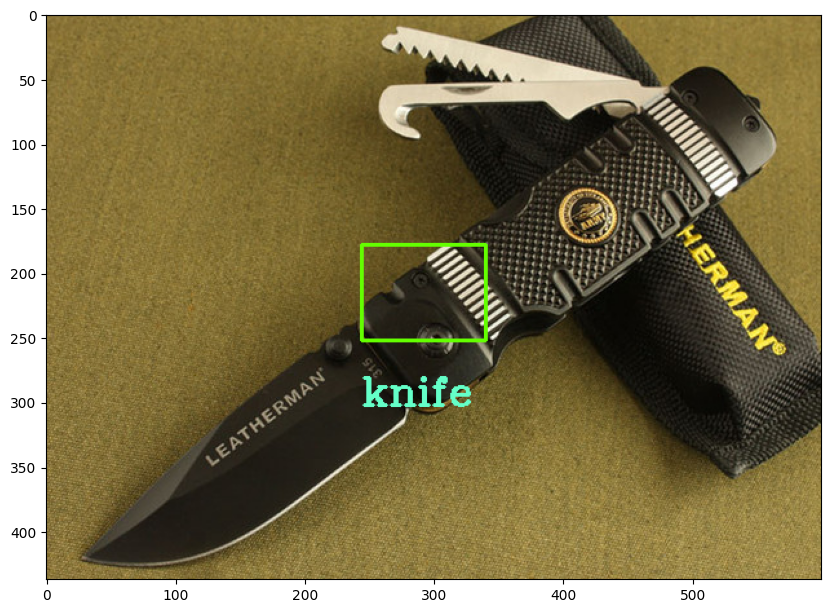

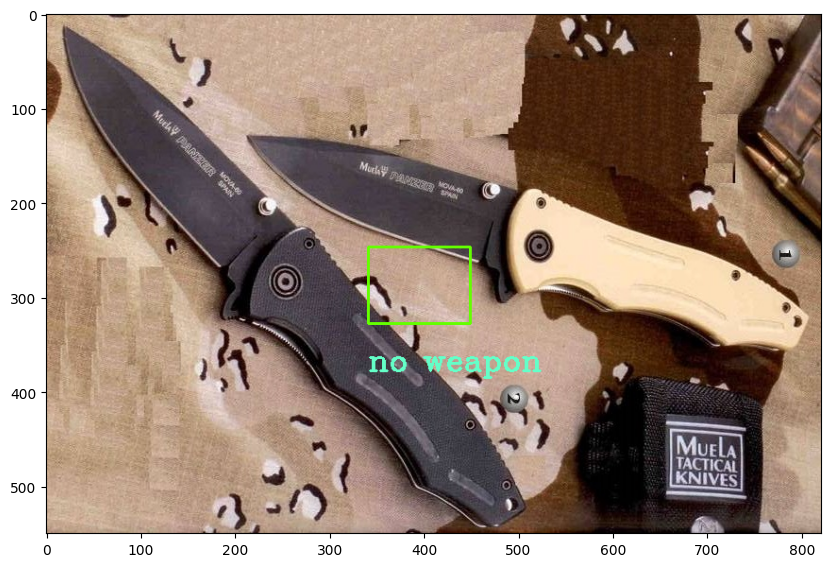

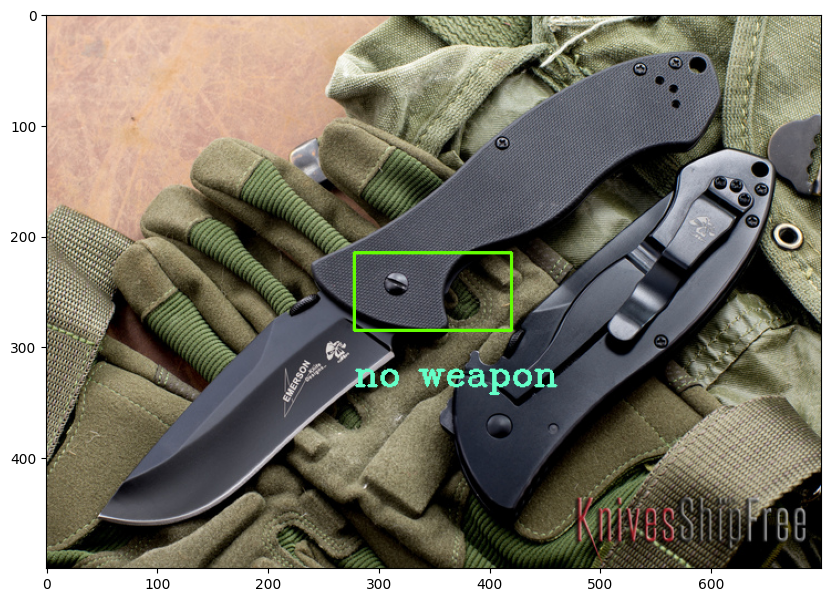

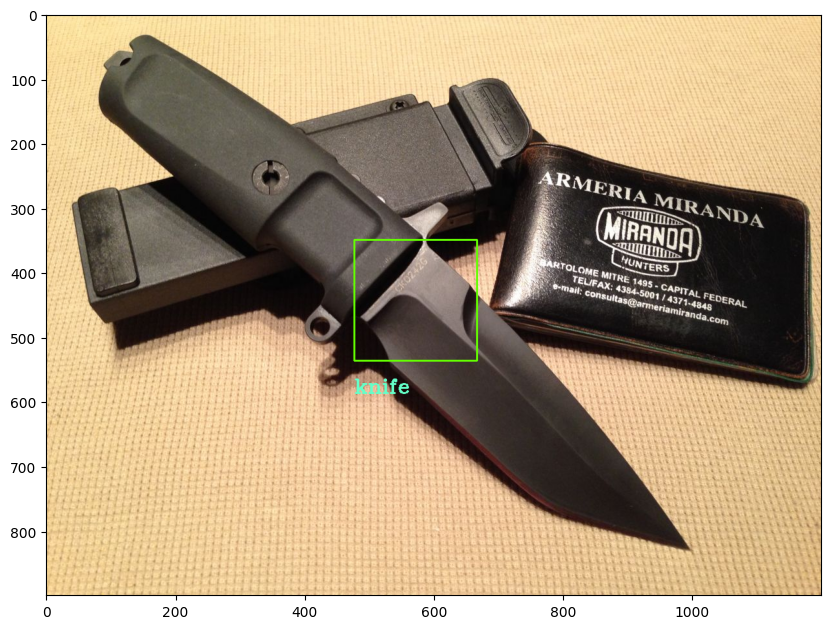

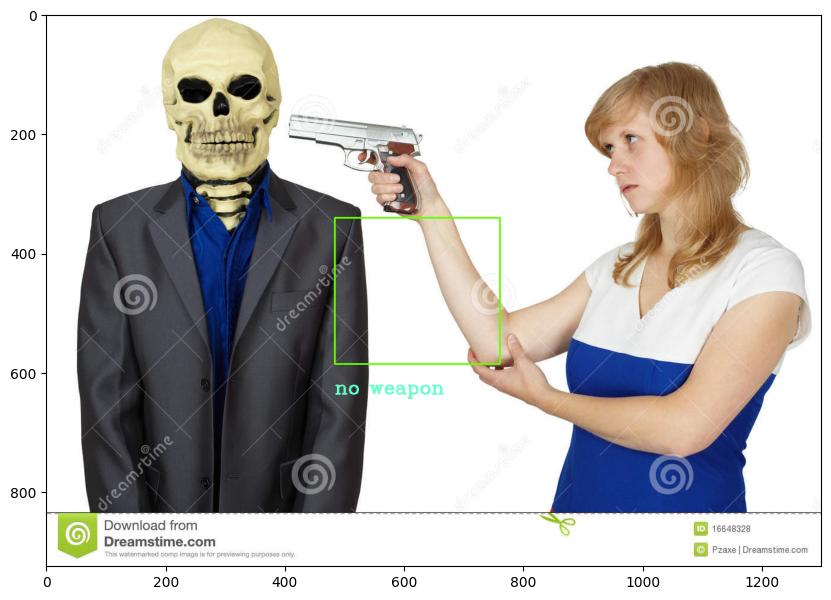

...

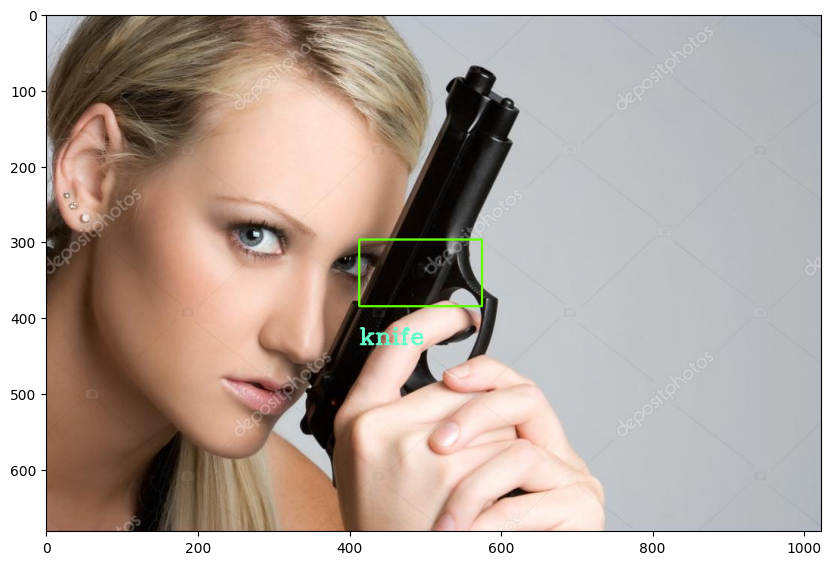

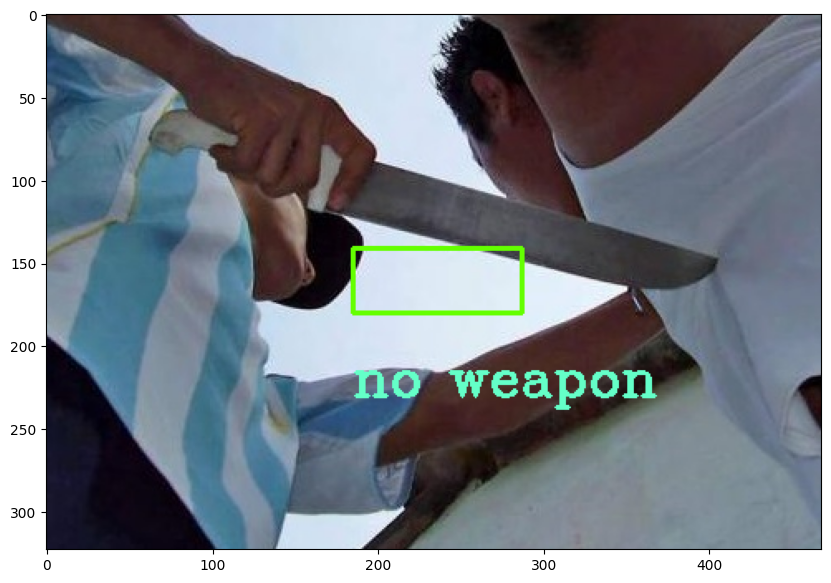

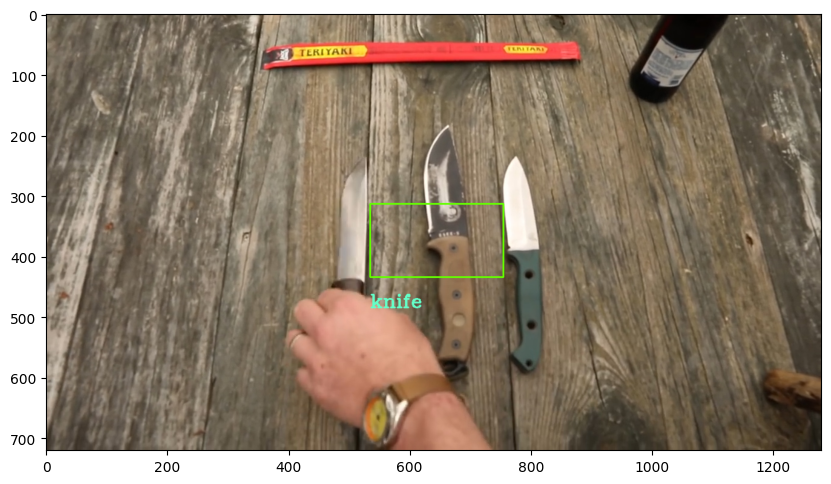

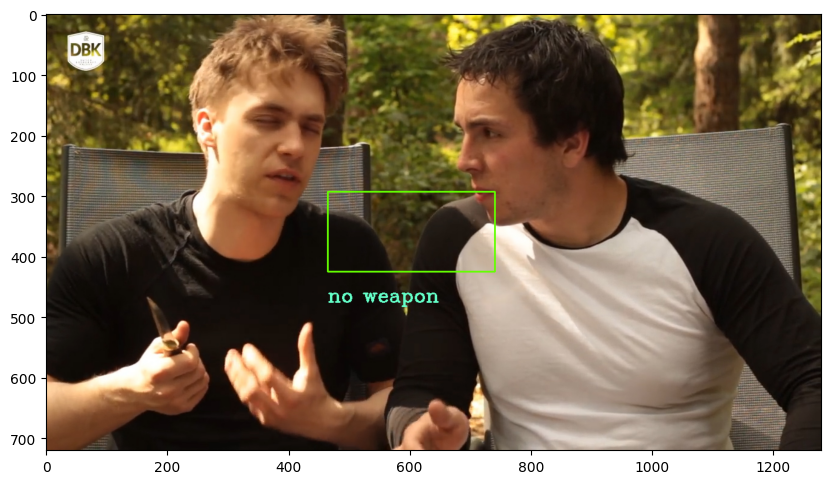

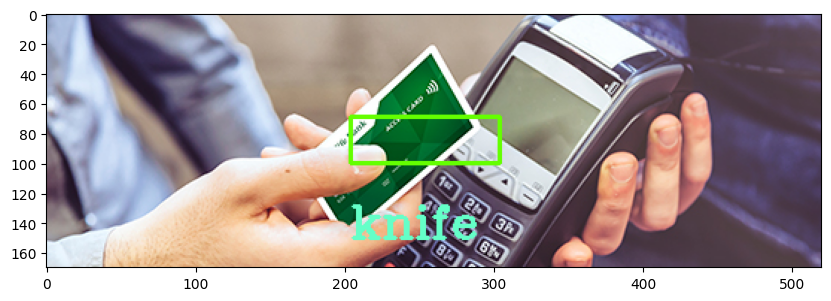

In [32]:
for i,img in enumerate(test_image):
  if i>=100:
      file_dir=os.path.join(img_dir,img)
      image = cv2.imread(file_dir)
      predict(image, scale = 1)
  if i==110:
    break

In [33]:
model_path = "/path/to/your/model/trained_model.h5"

In [1]:
import cv2
import numpy as np
import tensorflow as tf

# Modeli yükleyin
model_path = "weapon_detect.h5"  # Model dosyanızın yolu
model = tf.keras.models.load_model(model_path)

# Sınıf ve kutu tahminleri için modelin çıktı adları
class_names = ['no weapon', 'knife']  # Sınıf adlarınız
image_size = 300  # Modelin giriş boyutu

def preprocess_image(image):
    """
    Kameradan alınan görüntüyü modele uygun hale getirir.
    """
    resized_image = cv2.resize(image, (image_size, image_size))
    normalized_image = resized_image.astype("float32") / 255.0
    return normalized_image

def draw_predictions(image, boxes, class_id):
    """
    Tespit edilen nesneler için görüntü üzerine kutu ve etiket çizer.
    """
    height, width, _ = image.shape
    for box, cls in zip(boxes, class_id):
        # Box değerlerini yeniden ölçeklendir
        x1 = int(box[0] * width)
        y1 = int(box[1] * height)
        x2 = int(box[2] * width)
        y2 = int(box[3] * height)

        # Kutu çizin
        color = (0, 255, 0) if cls == 1 else (255, 0, 0)
        cv2.rectangle(image, (x1, y1), (x2, y2), color, 2)

        # Etiket ekleyin
        label = f"{class_names[cls]}"
        cv2.putText(image, label, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

# Kamerayı aç
cap = cv2.VideoCapture(0)  # Varsayılan kamera (0)

if not cap.isOpened():
    print("Kamera açılamadı.")
    exit()

while True:
    # Kamera karesini al
    ret, frame = cap.read()
    if not ret:
        print("Görüntü alınamadı, çıkılıyor.")
        break

    # Modelin beklentisine uygun şekilde preprocess
    preprocessed_frame = preprocess_image(frame)
    preprocessed_frame = np.expand_dims(preprocessed_frame, axis=0)

    # Modelden tahmin al
    box_predictions, class_predictions = model.predict(preprocessed_frame)

    # Tahmin edilen sınıf ve kutuları görüntü üzerine çiz
    predicted_class = np.argmax(class_predictions[0])
    draw_predictions(frame, [box_predictions[0]], [predicted_class])

    # Sonuçları göster
    cv2.imshow("Weapon Detection", frame)

    # 'q' tuşuna basıldığında döngüden çık
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

# Kaynakları serbest bırak ve pencereleri kapat
cap.release()
cv2.destroyAllWindows()


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━

: 

In [7]:
import cv2

def predict(image,returnimage = False,scale = 0.9):
    # ... your original code

    # Print image shape before displaying
    print(result_image.shape)

    cv2.imshow('Prediction', result_image)
    cv2.waitKey(0)
    cv2.destroyAllWindows()

In [4]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.inception_v3 import preprocess_input, decode_predictions

# Load the pre-trained InceptionV3 model
model = tf.keras.applications.InceptionV3(weights='imagenet')

# Path to the image
img_path = '/Users/didaryilmaz/Downloads/archive (6)/test/test/army.jpg'

# Load and preprocess the image
img = image.load_img(img_path, target_size=(299, 299))
x = image.img_to_array(img)
x = np.expand_dims(x, axis=0)
x = preprocess_input(x)

# Predict using the model
preds = model.predict(x)

# Decode predictions
decoded_preds = decode_predictions(preds, top=3)

# Print the predictions
for i, (imagenet_id, class_name, prob) in enumerate(decoded_preds[0]):
    print(f'{i + 1}. {class_name}: {prob:.3f}')


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 949ms/step
1. military_uniform: 0.843
2. rifle: 0.073
3. assault_rifle: 0.060


In [10]:
import tensorflow as tf
from tensorflow.keras.preprocessing import image
import numpy as np
import cv2
import matplotlib.pyplot as plt

# Preprocess function
def preprocess(img, image_size=300):
    try:
        img = cv2.resize(img, (image_size, image_size))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = img.astype("float") / 255.0
        img = np.expand_dims(img, axis=0)  # Add batch dimension
        return img
    except Exception as e:
        print(f"Error preprocessing image: {e}")
        return None

# Predict function
def predict(img, model, image_size=300):
    preprocessed_image = preprocess(img, image_size)
    if preprocessed_image is None:
        print("Error in preprocessing. Cannot predict.")
        return None

    predictions = model.predict(preprocessed_image)
    predicted_class = np.argmax(predictions[0])  # Get class with highest probability
    print("Predicted class:", predicted_class)
    return predictions

# Load model
model_path = 'weapon_detect.h5'
model = tf.keras.models.load_model(model_path)

# Read image
img_path = '/Users/didaryilmaz/Downloads/archive (6)/test/test/army.jpg'
img = cv2.imread(img_path)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
Predicted class: 3


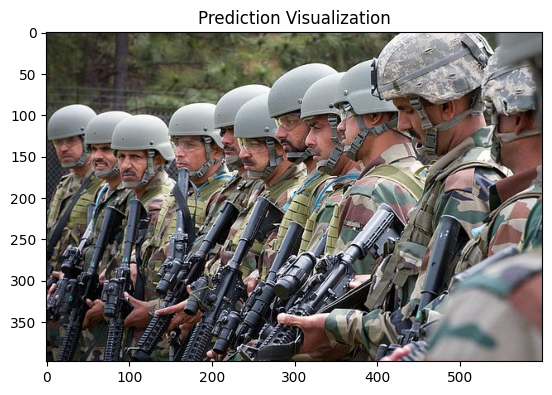

In [11]:
# Predict on image
result_predictions = predict(img, model)

# Display the image using matplotlib for better visualization
if result_predictions is not None:
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title("Prediction Visualization")
    plt.show()
else:
    print("Prediction failed.")

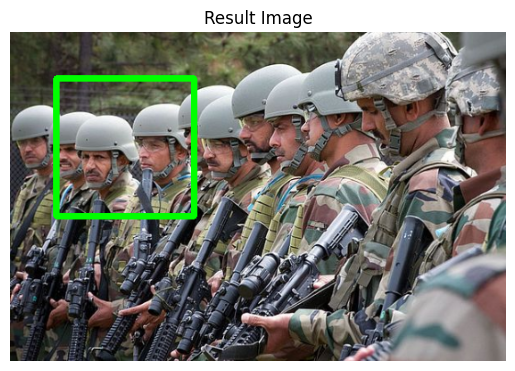

In [17]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Define the predict function
def predict(image, scale=0.9):
    """
    Simulate a prediction process by resizing the image and returning it.
    This is a placeholder for actual model predictions.
    """
    try:
        # Resize the image to simulate prediction (optional for demonstration)
        height, width = image.shape[:2]
        resized_image = cv2.resize(image, (int(width * scale), int(height * scale)))

        # Perform a dummy operation (like drawing a rectangle)
        result_image = resized_image.copy()
        cv2.rectangle(result_image, (50, 50), (200, 200), (0, 255, 0), 5)

        return result_image
    except Exception as e:
        print(f"Error in predict function: {e}")
        return None

# Load the sample image
img_path = '/Users/didaryilmaz/Downloads/archive (6)/test/test/army.jpg'
image = cv2.imread(img_path)

# Check if the image is loaded correctly
if image is not None:
    # Call the predict function
    result_image = predict(image)

    # Check if prediction succeeded
    if result_image is not None:
        # Display the image using matplotlib for better visualization
        plt.imshow(cv2.cvtColor(result_image, cv2.COLOR_BGR2RGB))
        plt.title("Result Image")
        plt.axis('off')
        plt.show()
    else:
        print("Prediction failed: result_image is None.")
else:
    print(f"Failed to load image from path: {img_path}")


In [19]:
import numpy as np
import cv2
import os
from tensorflow.keras.preprocessing import image
from PIL import Image
import tensorflow as tf

def preprocess(img, image_size=300):
    try:
        # Resize and normalize the image
        image_resized = cv2.resize(img, (image_size, image_size))
        image_resized = cv2.cvtColor(image_resized, cv2.COLOR_BGR2RGB)
        image_resized = image_resized.astype("float") / 255.0
        return np.expand_dims(image_resized, axis=0)  # Add batch dimension
    except Exception as e:
        print(f"Error preprocessing image: {e}")
        return None

# Load the model
model_path = 'weapon_detect.h5'
model = tf.keras.models.load_model(model_path)

# Path to the image
img_path = '/Users/didaryilmaz/Downloads/archive (6)/test/test/army.jpg'

# Check if the image file exists
if not os.path.exists(img_path):
    print("Image file not found:", img_path)
else:
    # Load the image using OpenCV
    img = cv2.imread(img_path)
    if img is None:
        print("Error loading image:", img_path)
    else:
        # Convert to PIL Image for compatibility with keras
        pil_img = Image.fromarray(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))  # Convert BGR to RGB
        x = image.img_to_array(pil_img)
        x = preprocess(x)  # Preprocess the image

        if x is not None:
            # Predict using the model
            predictions = model.predict(x)
            predicted_class = np.argmax(predictions[0])
            print("Predicted class:", predicted_class)
        else:
            print("Image preprocessing failed")


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
Predicted class: 2


Using cache found in /Users/didaryilmaz/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-12-27 Python-3.9.21 torch-2.5.1 CPU

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 
/Users/didaryilmaz/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
image 1/1: 443x760 5 persons
Speed: 1.8ms pre-process, 47.3ms inference, 0.6ms NMS per image at shape (1, 3, 384, 640)


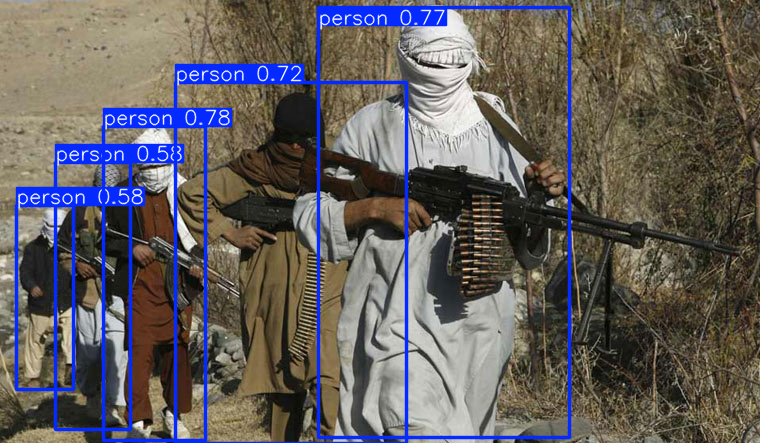

In [1]:
import torch
import cv2
from PIL import Image
import numpy as np

# Load the YOLOv5 model
model = torch.hub.load('ultralytics/yolov5', 'yolov5s')  # Replace 'yolov5s' with the model variant (e.g., 'yolov5m', 'yolov5l', etc.)

# Preprocess the image
def preprocess_image(img_path):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return img  # YOLOv5 accepts numpy arrays directly

img_path = '/Users/didaryilmaz/Downloads/archive (6)/test/test/terrorists.jpg'

# Load and preprocess the image
img = preprocess_image(img_path)

# Make predictions
results = model(img)

# Display results
results.print()  # Print results in the console
results.show()   # Display predictions on the image


In [10]:
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [12]:
# Load the model
model_path = 'weapon_detect.h5'
model = load_model(model_path)

# Image dimensions and batch size
img_height, img_width = 224, 224
batch_size = 32

# Prepare image data
test_datagen = ImageDataGenerator(rescale=1./255)

# Adjust the directory path according to your structure
test_generator = test_datagen.flow_from_directory(
    '/Users/didaryilmaz/Downloads/archive (6)/test/test',  # Assuming subdirectories for classes
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical'  
)

if len(test_generator) > 0:
  predictions = model.predict(test_generator)
  
else:
  print("No images found in the specified directory.")

Found 0 images belonging to 0 classes.
No images found in the specified directory.


In [16]:
from tensorflow.keras.utils import load_img, img_to_array
import numpy as np

# Load the model
model_path = 'weapon_detect.h5'
model = load_model(model_path)

# Correct image dimensions
img_height, img_width = 300, 300  # Match model's input shape

# Load and preprocess the image
img_path = '/Users/didaryilmaz/Downloads/archive (6)/test/test/army.jpg'  # Replace with a valid image path
img = load_img(img_path, target_size=(img_height, img_width))  # Resize to 300x300
img_array = img_to_array(img) / 255.0  # Normalize pixel values
img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension

# Make predictions
predictions = model.predict(img_array)

# Display the predictions
print("Predictions:", predictions)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
Predictions: [array([[0.43265587, 0.38567862, 0.54569834, 0.5835986 ]], dtype=float32), array([[0.09357619, 0.9064238 ]], dtype=float32)]


In [21]:
test_generator = test_datagen.flow_from_directory(
    '/Users/didaryilmaz/Downloads/archive (6)/test/',
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False
)


Found 5 images belonging to 1 classes.


In [30]:
import os
print(os.listdir('/Users/didaryilmaz/Downloads/archive (6)/test/'))


['.DS_Store', 'test']


In [31]:
# Prepare test data
test_directory = '/Users/didaryilmaz/Downloads/archive (6)/test/'  # Ensure this points to the correct directory
test_datagen = ImageDataGenerator(rescale=1./255)

test_generator = test_datagen.flow_from_directory(
    test_directory,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical',  # Ensure your model supports categorical labels
    shuffle=False
)

# Check if the generator is empty
if test_generator.samples == 0:
    raise ValueError(f"No images found in directory: {test_directory}")


Found 5 images belonging to 1 classes.


In [35]:
print(model.input_shape)


(None, 300, 300, 3)


In [36]:
for batch in test_generator:
    print(batch[0].shape)  # Print the shape of the first batch
    break


(5, 224, 224, 3)


In [37]:
test_generator = test_datagen.flow_from_directory(
    test_directory,
    target_size=(224, 224),  # Replace with the model's expected height and width
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False
)


Found 5 images belonging to 1 classes.
